In [1]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import os
from statistics import mean
from statistics import median

In [2]:
#Main Function to run analysis
def runAnalysis(timePath, lifetimePath, SSPath, trim, minLength):
    time = list(pd.read_csv(timePath, header = None)[0])
    lifetime = list(pd.read_csv(lifetimePath, header = None)[0])
    SS = list(pd.read_csv(SSPath, header = None)[0])
    states = {'state1': [1 if i == 1 else 0 for i in SS], 'state2':[1 if i == 2 else 0 for i in SS], 
              'state3': [1 if i == 3 else 0 for i in SS], 'state4':[1 if i == 4 else 0 for i in SS]}
    stateColors = {'state1': 'green', 'state2':'blue', 
                   'state3': 'red', 'state4':'yellow'}
    print('legend: ')
    print(stateColors)
    print('Raw Data')
    plotData(time, states, lifetime, stateColors, True)
    states_analyzed, stateWindows, timeWindows = stateAnalysis(lifetime, states, time, trim, minLength)
    print('Trimmed Data')
    plotData(time, stateWindows, lifetime, stateColors, False)
    
    
    
    states_analyzed_Formatted = {key:pd.Series(value) for key, value in states_analyzed.items()}
    stateWindows_Formatted = {key:pd.Series(value) for key, value in stateWindows.items()}
    timeWindows_Formatted =  {key:pd.Series(value) for key, value in timeWindows.items() }
    
    nestedDict = {k: {'Lifetime Analysis': states_analyzed_Formatted[k], 'Index': stateWindows_Formatted[k], 'Time': timeWindows_Formatted[k]} for k in timeWindows_Formatted.keys()}
    reformed_dict = {}
    for outerKey, innerDict in nestedDict.items():
        for innerKey, values in innerDict.items():
            reformed_dict[(outerKey,
                           innerKey)] = values
    pd.options.display.max_seq_items = 2000        
    results_df = pd.DataFrame(reformed_dict)

    return results_df

    
#Takes in data, omits epochs too short, trims transition periods, analyzes epochs after trimming. 
def stateAnalysis(lifetime, stateData, time, trim, minLength):
    states_analyzed = {}
    stateWindows = {}
    timeWindows = {}
    for key in stateData:
        analyzedWindows = []
        changes = stateChanges(stateData[key])
        

        #omit epochs too short, analyze windows long enough
        i = 0
        while i < len(changes):
            if time[changes[i][1]]-time[changes[i][0]]<minLength:
                changes.remove(changes[i]) #removing epochs too short
            else:
                #trimming ends of epochs
                changes[i][0] = find_nearest(time, time[changes[i][0]]+trim) 
                changes[i][1] = find_nearest(time, time[changes[i][1]]-trim) 
                #analyzedWindows.append(max_surroundMean(lifetime[changes[i][0]:changes[i][1]], 1))
                if len(lifetime[changes[i][0]:changes[i][1]])>1:
                    analyzedWindows.append(median(lifetime[changes[i][0]:changes[i][1]]))
                i+=1
        states_analyzed[key] = analyzedWindows
        stateWindows[key] = changes
        np.save((path + 'results/' + key + 'test.npy'),changes)
        timeWindows[key] = [[time[i[0]],time[i[1]]] for i in changes]
    return states_analyzed, stateWindows, timeWindows
   
#Takes in a list, finds average of max value and n surrounding data points
def max_surroundMean(data, n):
    maxIDX = data.index(max(data))    
    if maxIDX == 0:
        maxIDX = n
    elif maxIDX == len(data)-1:
        maxIDX = maxIDX-n
    return mean(data[maxIDX-n:maxIDX+n+1])
        
#returns index of closest corresponding value in the array 
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
        
#Returns list of pairs (index) [[start, stop], [start, stop]] for all "true" periods
def stateChanges(data):
    currState = data[0]
    if currState:
        temp = [0]
    changes = []
    for i in range(len(data)):
        if data[i] != currState:
            currState = data[i]
            if currState:
                temp = [i]
            else:
                temp.append(i-1)
                changes.append(temp)
        #if you reach the end of the time series
        elif data[i] and i == (len(data)-1):
                temp.append(i)
                changes.append(temp)
        else:
            pass
    
    return changes
    
def plotData(time, states, lifetime, stateColors, rawStates):
    fig, ax1 = plt.subplots(figsize=(200, 10))
    ax1.plot(time, lifetime)
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel('Lifetime (ns)')
    for key in states:
        if rawStates:
            changes = stateChanges(states[key])
            for i in changes:
                ax1.axvspan(time[i[0]], time[i[1]], color=stateColors[key], alpha=0.5)
        else:
            for i in states[key]:
                ax1.axvspan(time[i[0]], time[i[1]], color=stateColors[key], alpha=0.5)
            
    plt.show()
    


In [23]:
    #path = '20220214_1610_SW_001_analysis_csv_20220426/'
    #path = '20220219_1610_SW_002_analysis_csv_20220426/'
    #path = '20220301_1612_SW_003_analysis_csv_20220426/'
    #path = '20220302_1611_SW_003_analysis_csv_20220426/'
    #path = '20220304_1630_SW_002_analysis_csv_20220426/'
    #path = '20220312_1629_SW_002_analysis_csv_20220426/'
    #path = '20220313_1626_SW_002_analysis_csv_20220426/'
    #path = '20220314_1610_SW_003_analysis_csv_20220426/'
    #path = '20220315_1612_SW_004_analysis_csv_20220426/'
    #path = '20220316_1611_SW_004_analysis_csv_20220426/'
    #path = '20220317_1627_SW_002_analysis_csv_20220426/'
    
    #path = '20220318_1626_SW_003_analysis_csv_20220426/'
    #path = '20220319_1630_SW_003_analysis_csv_20220426/'
    #path = '20220322_1627_SW_003_analysis_csv_20220426/'
    #path = '20220323_1629_SW_003_analysis_csv_20220426/'
    #path = '20220324_1612_SW_005_analysis_csv_20220426/'
    #path = '20220325_1611_SW_005_analysis_csv_20220426/'
    #path = '20220328_1610_SW_005_analysis_csv_20220426/'
    #path = '20220329_1626_SW_004_analysis_csv_20220426/'
    #path = '20220330_1630_SW_004_analysis_csv_20220426/'
    #path = '20220331_1629_SW_004_analysis_csv_20220426/'
    #path = '20220402_1627_SW_004_analysis_csv_20220426/'
#     path = 'ACh_mut/20220206_112_8_AChMut_SW_001_analysis_csv_20220510/'
    path = 'ACh_mut/20220207_109_AChMut_SW_001_analysis_csv_20220510/'
#     path = 'ACh_mut/20220422_112_AChmtut_SW_001_analysis_csv_20220426/'
#     path = 'ACh_mut/20220425_109_AChmut_SW_001_analysis_csv_20220510/'
    
    
    
    
    
    
    os.mkdir(path + 'results')

In [24]:
#Parameters
timePath = path + 'time.csv'
lifetimePath = path + 'lft_emp.csv'
statesPath = path + 'states.csv'


trim = 12               #how much to trim from beginning/end of epochs
minLength = 16+(2*trim) #minimum length of epochs to include 
                        #(length before trimming, so if you want 10 secopnds minimum then use 10+(2*trim) as the value)

#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time
    


legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


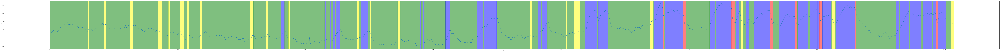

Trimmed Data


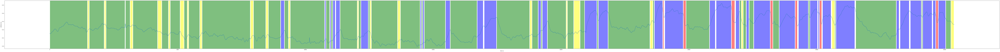

In [25]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimePath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_epoch_analysis.csv'),index=False)

In [26]:
results

state1                                                state2  \
   Lifetime Analysis           Index                Time Lifetime Analysis   
0            4.12290      [12, 1432]    [13.032, 1466.3]           4.11520   
1            4.12130    [1519, 2059]    [1556.7, 2118.4]           4.10820   
2            4.12190    [2149, 2844]    [2212.1, 2935.5]           4.10580   
3            4.12475    [2872, 3032]    [2968.4, 3131.6]           4.11040   
4            4.12070    [3159, 4086]    [3261.2, 4206.8]           4.11670   
5            4.11460    [4268, 4502]    [4392.5, 4631.4]           4.11450   
6            4.11610    [4593, 4944]    [4724.3, 5087.4]           4.10200   
7            4.10880    [5114, 5213]    [5264.2, 5367.2]           4.10480   
8            4.11120    [5288, 5682]    [5445.2, 5855.0]           4.11255   
9            4.11150    [5791, 7606]    [5968.4, 7834.1]           4.11490   
10           4.11050    [7749, 8198]    [7980.0, 8438.4]           4.13245   
11           4.11020    [8320, 8758]    [8563.1, 9017.7]           4.11580   
12           4.11375    [8924, 9054]    [9190.4, 9325.6]           4.12380   
13           4.10500   [9140, 10420]   [9415.1, 10738.0]           4.13990   
14           4.10460  [10496, 10617]  [10815.0, 10938.0]           4.14160   
15           4.10670  [10692, 10733]  [11015.0, 11057.0]           4.14710   
16           4.10870  [11037, 11674]  [11367.0, 12017.0]           4.14150   
17           4.11030  [11746, 11810]  [12091.0, 12157.0]           4.13525   
18           4.11830  [12111, 12150]  [12470.0, 12510.0]           4.14800   
19           4.10260  [12227, 13190]  [12590.0, 13593.0]           4.13575   
20           4.10560  [13318, 14051]  [13726.0, 14476.0]           4.12890   
21           4.10180  [14122, 14149]  [14549.0, 14576.0]           4.13880   
22           4.10420  [14232, 15022]  [14661.0, 15467.0]           4.13510   
23           4.10730  [15227, 16214]  [15677.0, 16703.0]           4.13600   
24           4.11210  [16966, 18214]  [17488.0, 18761.0]           4.14295   
25           4.11210  [18323, 18538]  [18873.0, 19092.0]           4.14080   
26           4.11940  [18672, 18694]  [19229.0, 19252.0]           4.13660   
27           4.11610  [18911, 19594]  [19477.0, 20187.0]           4.14670   
28           4.11560  [19662, 19880]  [20258.0, 20485.0]           4.11985   
29           4.11790  [20137, 20286]  [20753.0, 20908.0]           4.13355   
30           4.13410  [20782, 20813]  [21416.0, 21447.0]           4.13740   
31           4.12290  [21208, 22779]  [21850.0, 23467.0]           4.13930   
32           4.12920  [22910, 22939]  [23603.0, 23634.0]           4.14040   
33           4.12280  [24158, 25037]  [24898.0, 25794.0]           4.14030   
34           4.13900  [26198, 26247]  [26987.0, 27038.0]               NaN   
35           4.12610  [26339, 26430]  [27134.0, 27228.0]               NaN   
36           4.13010  [26562, 26711]  [27366.0, 27521.0]               NaN   
37           4.12630  [27452, 27671]  [28294.0, 28517.0]               NaN   
38           4.13765  [28814, 28848]  [29683.0, 29718.0]               NaN   
39           4.12560  [29813, 29832]  [30714.0, 30733.0]               NaN   
40           4.11610  [30601, 32129]  [31534.0, 33101.0]               NaN   
41           4.13590  [33106, 33127]  [34106.0, 34128.0]               NaN   
42           4.13050  [34020, 34193]  [35057.0, 35237.0]               NaN   

                                                  state3                  \
             Index                Time Lifetime Analysis           Index   
0     [8782, 8900]    [9042.7, 9165.4]            4.1389  [23280, 23302]   
1   [10445, 10471]  [10763.0, 10790.0]            4.1278  [24053, 24134]   
2   [10641, 10667]  [10963.0, 10989.0]            4.1302  [25898, 26005]   
3   [10758, 10831]  [11082.0, 11157.0]            4.1332  [27354, 27428]   
4   [10871, 11013]  [11198.0, 11342.0]         

In [27]:
#Parameters
timePath = path + 'time.csv'
lifetimeDCPath = path + 'lft_emp_DC.csv'
statesPath = path + 'states.csv'


#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


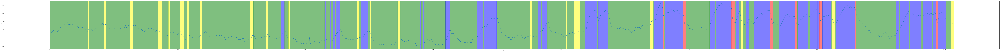

Trimmed Data


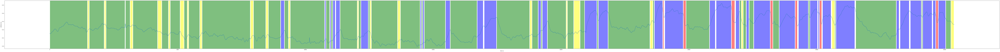

In [28]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimeDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_DC_epoch_analysis.csv'),index=False)

In [29]:
#Parameters
timePath = path + 'time.csv'
lifetimeACPath = path + 'lft_emp_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


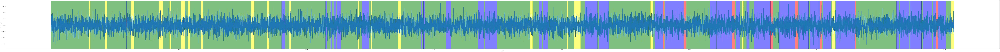

Trimmed Data


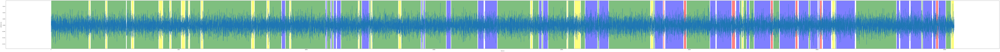

In [30]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimeACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_AC_epoch_analysis.csv'),index=False)

In [31]:
#Parameters
timePath = path + 'time.csv'
intensityPath = path + 'intensity.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


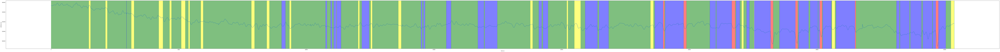

Trimmed Data


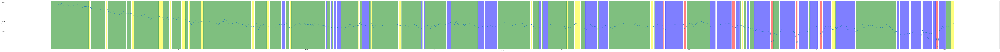

In [32]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_epoch_analysis.csv'),index=False)

In [33]:
#Parameters
timePath = path + 'time.csv'
intensityDCPath = path + 'intensity_DC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


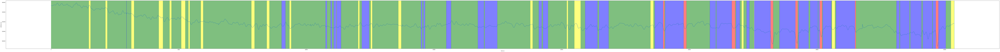

Trimmed Data


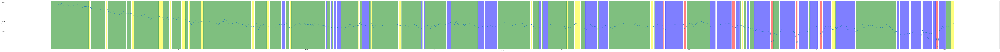

In [34]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_DC_epoch_analysis.csv'),index=False)

In [35]:
#Parameters
timePath = path + 'time.csv'
intensityACPath = path + 'intensity_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


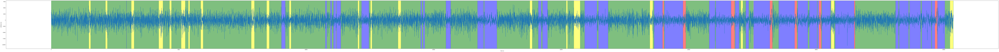

Trimmed Data


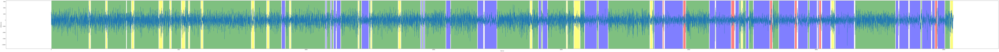

In [36]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_AC_epoch_analysis.csv'),index=False)

In [37]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitPath = path + 'lft_fit.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


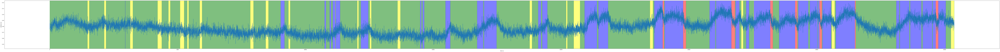

Trimmed Data


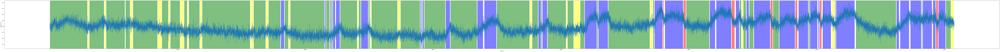

In [38]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_epoch_analysis.csv'),index=False)

In [39]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitDCPath = path + 'lft_fit_DC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


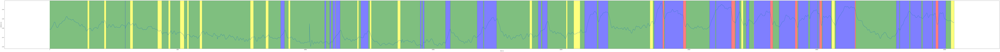

Trimmed Data


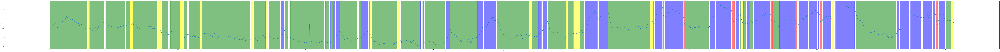

In [40]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_DC_epoch_analysis.csv'),index=False)

In [41]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitACPath = path + 'lft_fit_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


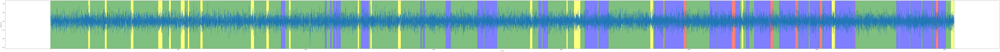

Trimmed Data


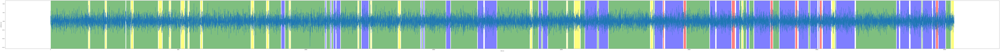

In [42]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_AC_epoch_analysis.csv'),index=False)